# What's the cause of cancellations in our spectra?

## Load data

In [675]:
using Damysos
using CairoMakie
using DSP
using FFTW

In [676]:
function applyhanning(x::Vector) 
    if iseven(length(x))
        pushfirst!(x,x[1])
    end
    return x .* hanning(length(x))
end

applyhanning (generic function with 1 method)

In [677]:
path = "/home/how09898/phd/data/hhgjl/tqt-compare/Ensemble[8](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-19_Whimsy/ensemble.meta"
# path = "/home/how09898/phd/data/hhgjl/tqt-compare/Ensemble[10](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-05_Skedoodle/ensemble.meta"
path = "/home/how09898/phd/data/hhgjl/tqt-compare/Ensemble[10](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-16_Ziggurat/ensemble.meta"
ens  = load(path)

Ensemble{Float64} of 10 Simulations{Float64}:
 id: t2_sweep_2024-02-16_Ziggurat
 datapath: /home/how09898/phd/data/hhgjl/tqt-compare/Ensemble[10](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-16_Ziggurat/
 plotpath: /home/how09898/phd/plots/hhgjl/tqt-compare/Ensemble[10](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-16_Ziggurat/


In [678]:
path = "/home/how09898/phd/data/hhgjl/tqt-compare/Ensemble[10](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-16_Ziggurat/t2=Inf/simulation.meta"
sim  = load(path)
ppath = "/home/how09898/phd/plots/hhgjl/tqt-compare/Ensemble[10](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-16_Ziggurat/t2=Inf/"
dpath = "/home/how09898/phd/data/hhgjl/tqt-compare/Ensemble[10](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-16_Ziggurat/t2=Inf/"
sim = Simulation(sim.hamiltonian,sim.drivingfield,sim.numericalparams,sim.observables,sim.unitscaling,sim.dimensions,sim.id,dpath,ppath)
pushfirst!(ens.simlist,sim);
ens

Ensemble{Float64} of 11 Simulations{Float64}:
 id: t2_sweep_2024-02-16_Ziggurat
 datapath: /home/how09898/phd/data/hhgjl/tqt-compare/Ensemble[10](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-16_Ziggurat/
 plotpath: /home/how09898/phd/plots/hhgjl/tqt-compare/Ensemble[10](2d)GappedDirac_GaussianEPulse_t2_sweep_2024-02-16_Ziggurat/


In [679]:
vtot = [s.observables[1].vx for s in ens.simlist];
vra  = [s.observables[1].vxintra for s in ens.simlist];
ver  = [s.observables[1].vxinter for s in ens.simlist];

In [680]:
fs  = 1 / getparams(ens[1]).dt
fre = periodogram(vtot[1],fs=fs).freq;

In [681]:
ftvtot = [rfft(applyhanning(v)) for v in vtot];
ftvra  = [rfft(applyhanning(v)) for v in vra];
ftver  = [rfft(applyhanning(v)) for v in ver];

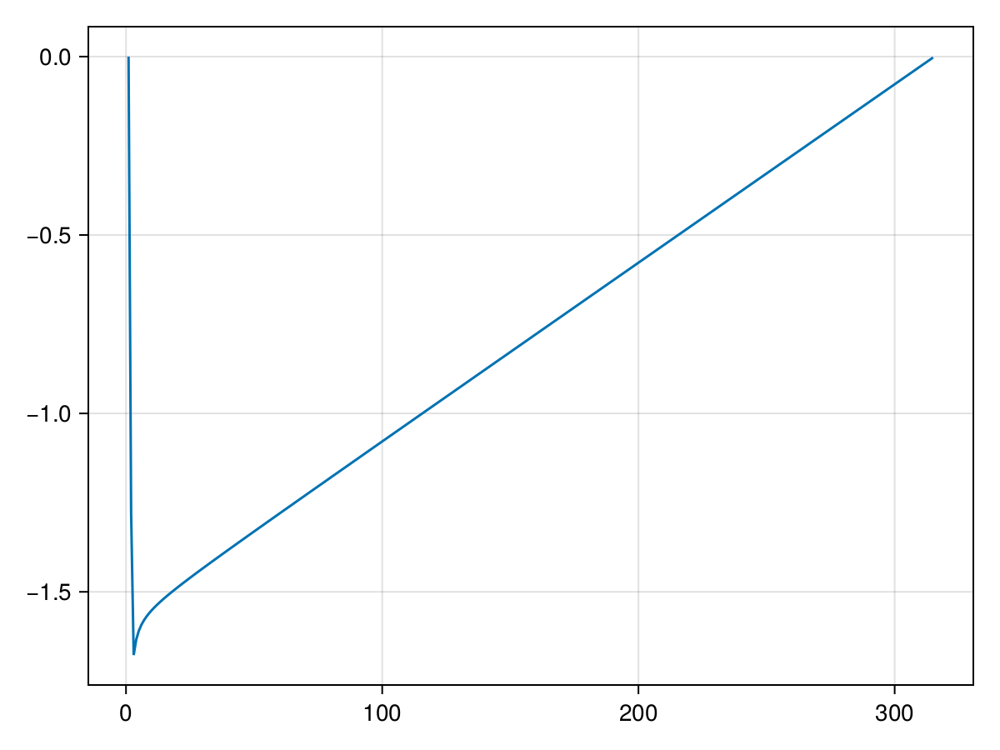

In [682]:
x=0:0.01:2π
# x=pad(collect(x),1_000)
y=sin.(x) + cos.(1.45 .* x)
f=Figure()
ax=Axis(f[1,1])
lines!(ax,angle.(rfft(y)))
f

## Spectra evolving with dephasing

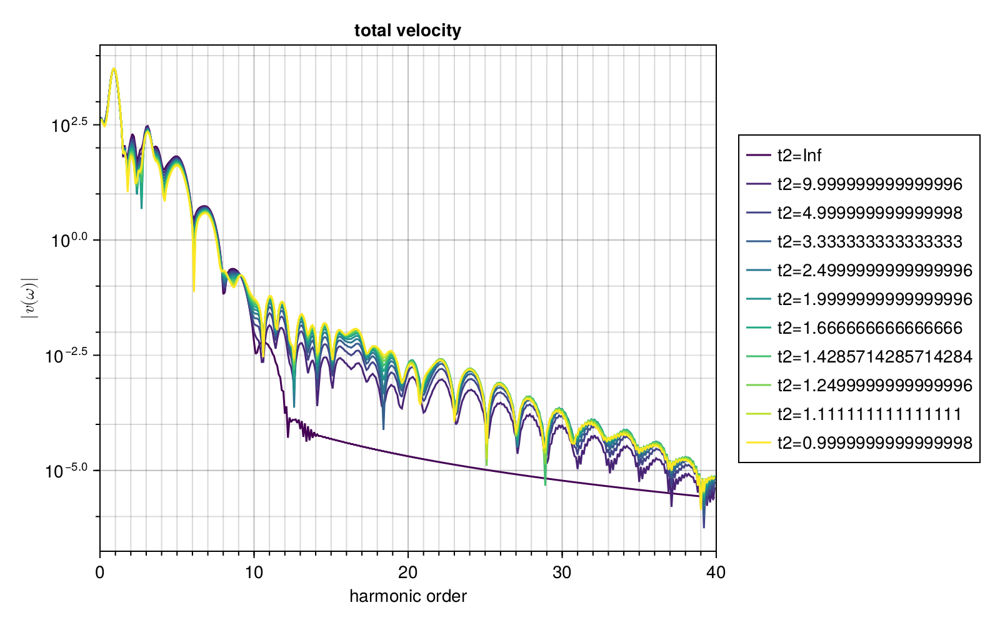

In [683]:
f   = Figure(size=(800,500))
ax  = Axis(f[1,1],yscale=log10,xlabel="harmonic order",ylabel=L"|v(ω)|",title="total velocity",
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorgridcolor=RGBAf(0,0,0,0.15),
    yminorgridcolor=RGBAf(0,0,0,0.15),
    xminorticks=0:100,
    yminorticksvisible=true,
    yminorgridvisible=true,
    yminorticks=[10.0^j for j in -20:10])
for (i,d) in enumerate(ftvtot)
    inds = abs.(d) .> 1e-30 .&& fre .< 40.0
    lines!(ax,fre[inds],abs.(d[inds]);color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end
xlims!(ax,0,40)
f[1,2] = Legend(f,ax)
f

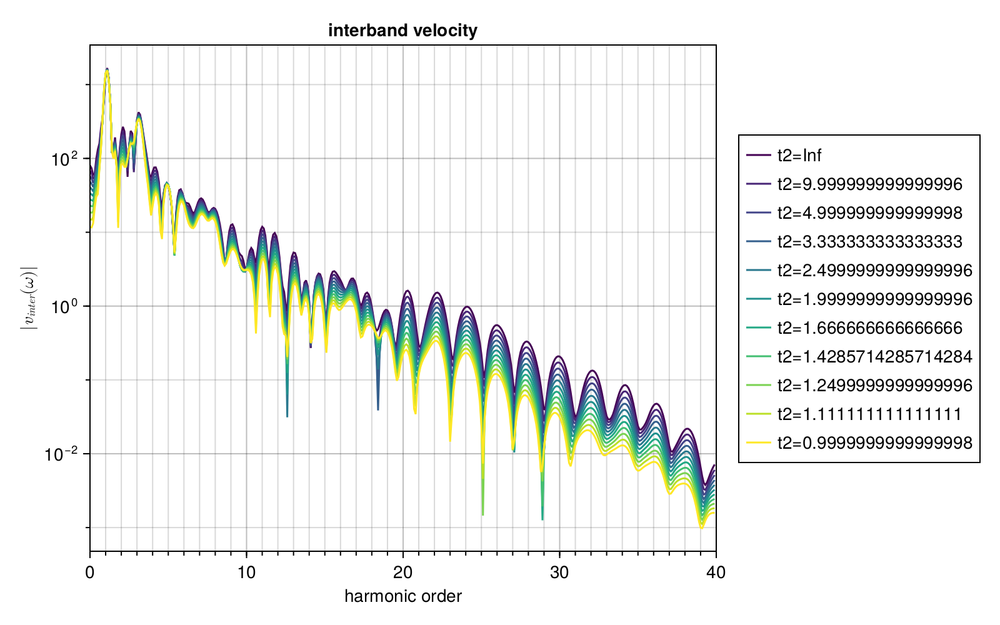

In [684]:
f   = Figure(size=(800,500))
ax  = Axis(f[1,1],yscale=log10,xlabel="harmonic order",ylabel=L"|v_{inter}(ω)|",title="interband velocity",
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorgridcolor=RGBAf(0,0,0,0.15),
    yminorgridcolor=RGBAf(0,0,0,0.15),
    xminorticks=0:100,
    yminorticksvisible=true,
    yminorgridvisible=true,
    yminorticks=[10.0^j for j in -20:10])
for (i,d) in enumerate(ftver)
    inds = abs.(d) .> 1e-30 .&& fre .< 40.0
    lines!(ax,fre[inds],abs.(d[inds]);color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end
xlims!(ax,0,40)
f[1,2] = Legend(f,ax)
f

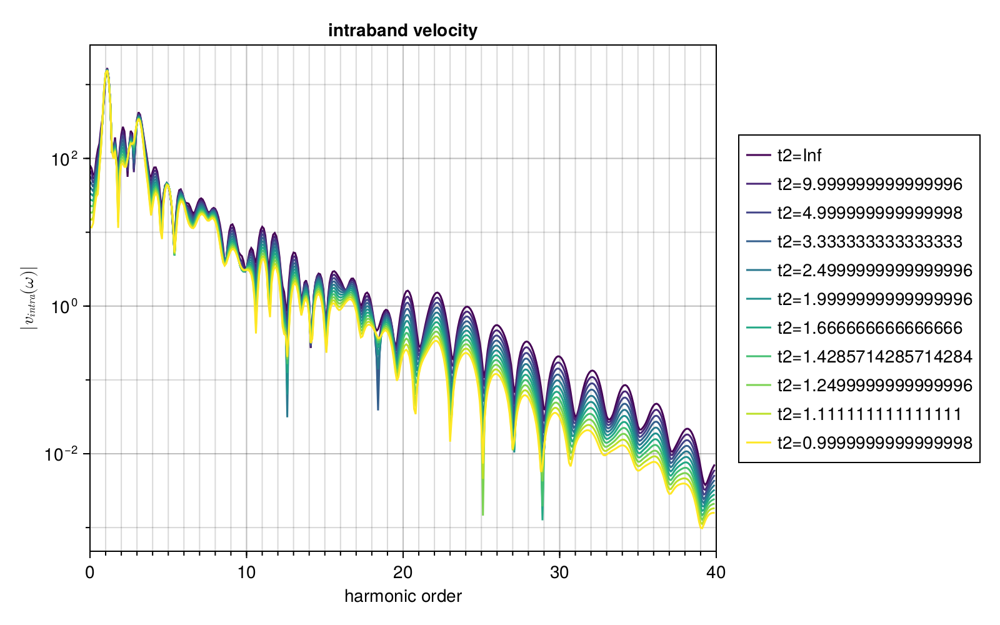

In [685]:
f   = Figure(size=(800,500))
ax  = Axis(f[1,1],yscale=log10,xlabel="harmonic order",ylabel=L"|v_{intra}(ω)|",title="intraband velocity",
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorgridcolor=RGBAf(0,0,0,0.15),
    yminorgridcolor=RGBAf(0,0,0,0.15),
    xminorticks=0:100,
    yminorticksvisible=true,
    yminorgridvisible=true,
    yminorticks=[10.0^j for j in -20:10])
for (i,d) in enumerate(ftver)
    inds = abs.(d) .> 1e-30 .&& fre .< 40.0
    lines!(ax,fre[inds],abs.(d[inds]);color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end
xlims!(ax,0,40)
f[1,2] = Legend(f,ax)
f

## Difference of absolute values of individual spectra

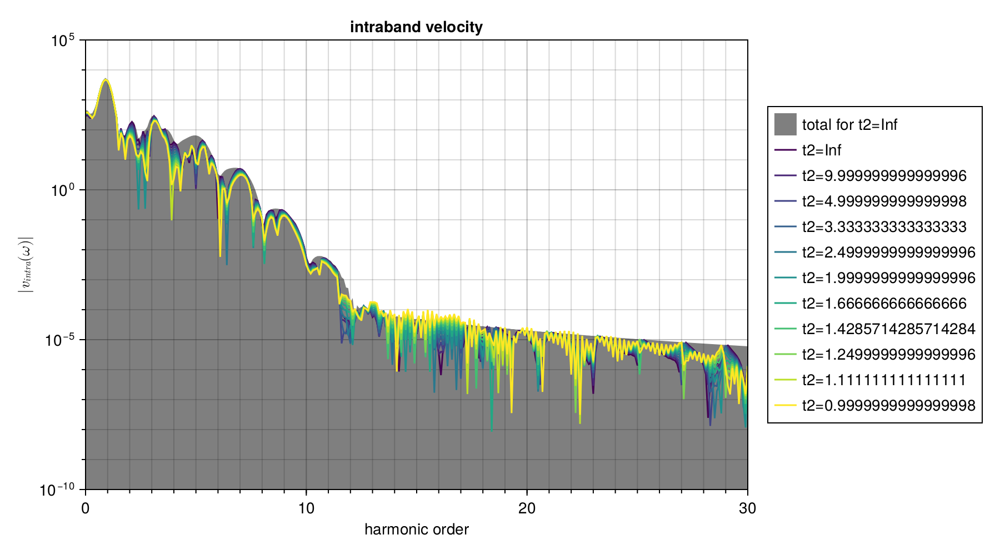

In [686]:
f   = Figure(size=(900,500))
ax  = Axis(f[1,1],yscale=log10,xlabel="harmonic order",ylabel=L"|v_{intra}(ω)|",title="intraband velocity",
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorgridcolor=RGBAf(0,0,0,0.15),
    yminorgridcolor=RGBAf(0,0,0,0.15),
    xminorticks=0:100,
    yminorticksvisible=true,
    yminorgridvisible=true,
    yminorticks=[10.0^j for j in -20:10])

band!(ax,fre,fill(1e-10,length(abs.(ftvtot[1]))),abs.(ftvtot[1]),color=(:black,0.5),label="total for t2=Inf")
for (i,v1,v2) in zip(1:length(vtot),ftver,ftvra)
    lines!(ax,fre,abs.(abs.(v1) .- abs.(v2)) ;color=i,colorrange=(1,length(vtot)),label=ens[i].id)
    #lines!(ax,fre,abs.(v1);color=i,colorrange=(1,length(vtot)),colormap=:magma)
end
xlims!(ax,0,30)
ylims!(ax,1e-10,10^5)
f[1,2] = Legend(f,ax)
f

### Define phase ∈ [0,2π)

In [687]:
a(z::Complex) = angle(z) >= zero(real(z)) ? angle(z) : 2π + angle(z)

a (generic function with 1 method)

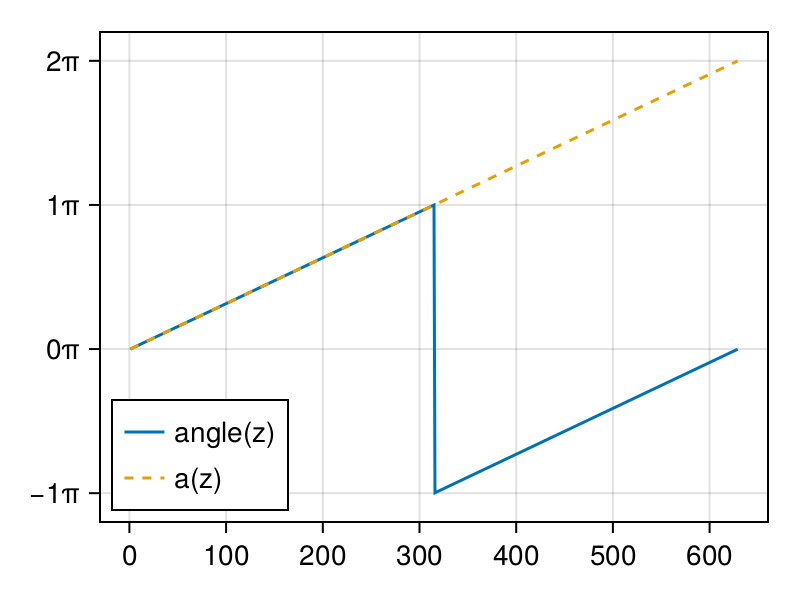

In [688]:
z=exp.(im .* collect(0:0.01:2π))
f = Figure(size=(400,300))
ax = Axis(f[1,1],yticks=MultiplesTicks(4,pi,"π"))
ylims!(ax,-1.2pi,2.2pi)
lines!(ax,angle.(z),label="angle(z)")
lines!(ax,a.(z),label="a(z)",linestyle=:dash)
axislegend(ax,position=:lb)
f

## Look at cosine of phase difference

$$ I\propto \omega^2\lvert j_{inter} + j_{intra}\rvert 
= \omega^2\left[\lvert j_{inter}\rvert^2 + \lvert j_{inter}\rvert^2 
+ 2|j_{inter}||j_{intra}|\cos(\phi_{inter} - \phi_{intra})\right] $$

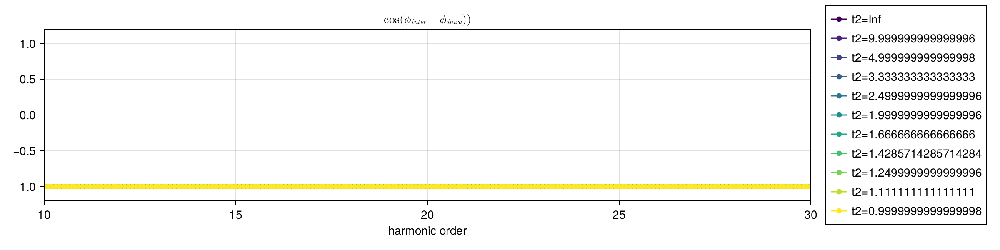

In [689]:
f   = Figure(size=(1200,300))
ax  = Axis(f[1,1],xlabel="harmonic order",title=L"\cos(\phi_{inter}-\phi_{intra}))")
for (i,v,v1,v2) in zip(1:length(vtot),ftvtot,ftver,ftvra)
    y = cos.(a.(v1) .- a.(v2)) 
    scatterlines!(ax,fre,y;color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end
xlims!(ax,10,30)
ylims!(ax,-1.2,1.2)
f[1,2] = Legend(f,ax)
f

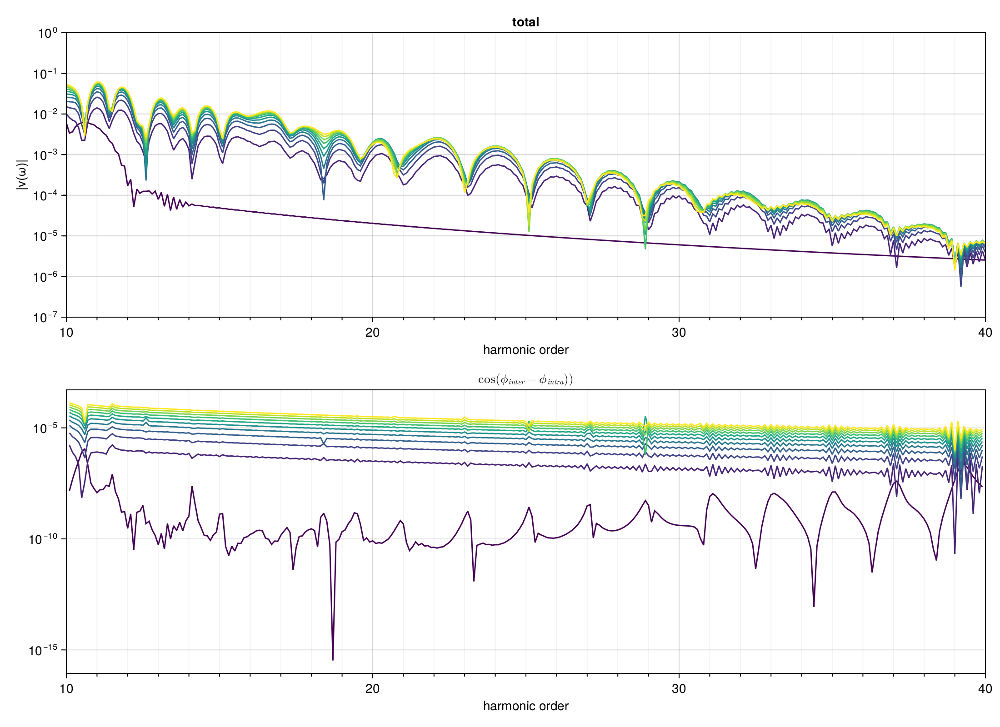

In [690]:
f   = Figure(size=(1100,800))
ax1 = Axis(f[1,1],yscale=log10,xlabel="harmonic order",ylabel="|v(ω)|",title="total",
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorticks=1:100,
    yminorticksvisible=true,
    yminorgridvisible=true,
    yminorticks=[10.0^j for j in -50:50])

ax2  = Axis(f[2,1],xlabel="harmonic order",title=L"\cos(\phi_{inter}-\phi_{intra}))",yscale=log10,
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorticks=1:100)
linkxaxes!(ax1, ax2)

xlims!(ax2,10,40)
for (i,d) in enumerate(ftvtot)
    inds = abs.(d) .> 1e-30 
    lines!(ax1,fre[inds],abs.(d[inds]);color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end

# f[1,2] = Legend(f,ax)

for (i,v,v1,v2) in zip(1:length(vtot),ftvtot,ftver,ftvra)
    y = @. cos(a(v1) - a(v2)) + 1.0
    inds = 10 .< fre .< 40
    lines!(ax2,fre[inds],y[inds];color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end

# ylims!(ax2,1,3)
ylims!(ax1,1e-7,1)
f

## Is it actually a power law?

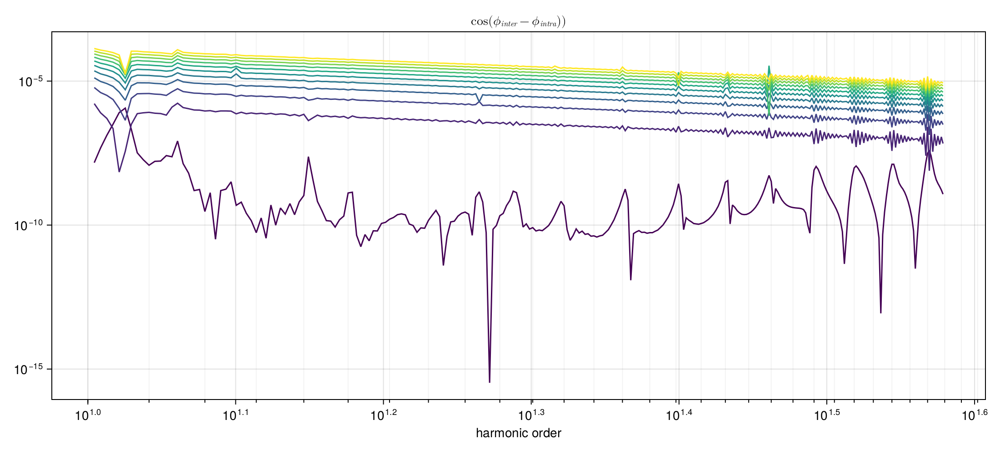

In [691]:
f   = Figure(size=(1100,500))
ax2  = Axis(f[1,1],xlabel="harmonic order",title=L"\cos(\phi_{inter}-\phi_{intra}))",yscale=log10,
    xscale=log10,
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorticks=1:100)

# xlims!(ax2,10,40)
for (i,v,v1,v2) in zip(1:length(vtot),ftvtot,ftver,ftvra)
    y = cos.(a.(v1) .- a.(v2)) .+ 1.0
    inds = 10 .< fre .< 38
    lines!(ax2,fre[inds],y[inds];color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end

# ylims!(ax2,1,3)
f

### What would happen if cos(ϕ1 - ϕ2) = 0

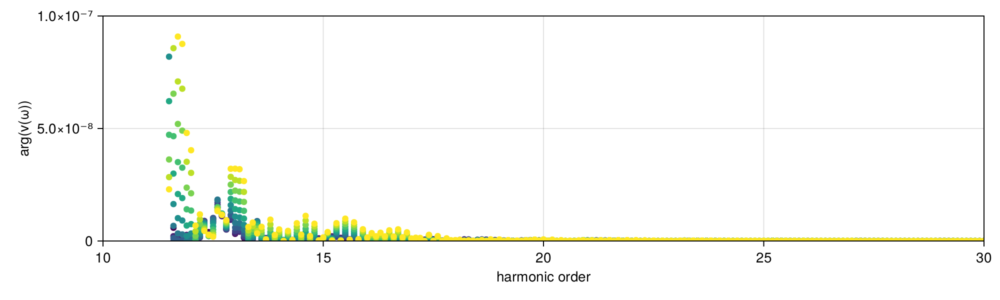

In [692]:
f   = Figure(size=(1000,300))
ax  = Axis(f[1,1],xlabel="harmonic order",ylabel="arg(v(ω))")
for (i,v,v1,v2) in zip(1:length(vtot),ftvtot,ftver,ftvra)
    y = @. abs2(v1) + abs2(v2) - 2abs(v1)*abs(v2)
    j = fre .> 10
    scatterlines!(ax,fre,y;color=i,colorrange=(1,length(vtot)))
end
xlims!(ax,10,30)
ylims!(ax,0.0,1e-7)
f

## Look at phases

### Phase of total velocity

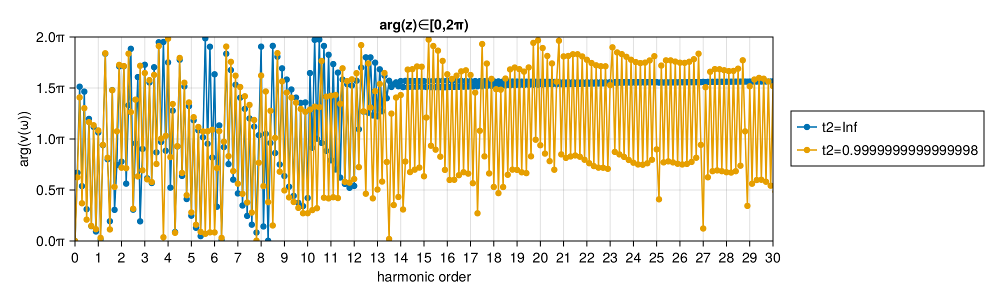

In [693]:
f   = Figure(size=(1000,300))
ax  = Axis(f[1,1],
    title="arg(z)∈[0,2π)",
    xlabel="harmonic order",
    ylabel="arg(v(ω))",
    yticks=MultiplesTicks(5,pi,"π"),
    xticks=0:100)

scatterlines!(ax,fre,a.(ftvtot[1]),label=ens[1].id)
scatterlines!(ax,fre,a.(ftvtot[end]),label=ens[end].id)
xlims!(ax,0,30)
ylims!(ax,0,2pi)
f[1,2] = Legend(f,ax)
f

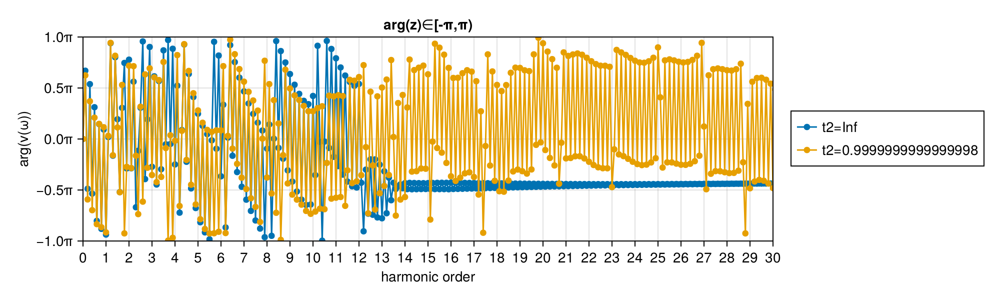

In [661]:
f   = Figure(size=(1000,300))
ax  = Axis(f[1,1],
    title="arg(z)∈[-π,π)",
    xlabel="harmonic order",
    ylabel="arg(v(ω))",
    yticks=MultiplesTicks(5,pi,"π"),
    xticks=0:100)

scatterlines!(ax,fre,angle.(ftvtot[1]),label=ens[1].id)
scatterlines!(ax,fre,angle.(ftvtot[end]),label=ens[end].id)
xlims!(ax,0,30)
ylims!(ax,-pi,pi)
f[1,2] = Legend(f,ax)
f

### Zoom in

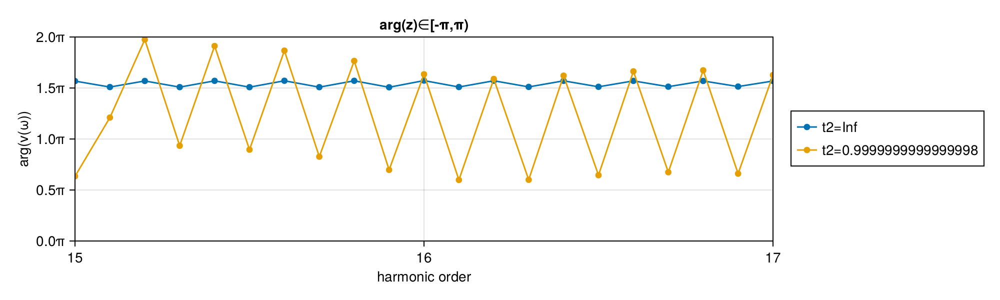

In [668]:
f   = Figure(size=(1000,300))
ax  = Axis(f[1,1],
    title="arg(z)∈[-π,π)",
    xlabel="harmonic order",
    ylabel="arg(v(ω))",
    yticks=MultiplesTicks(5,pi,"π"),
    xticks=0:100)

scatterlines!(ax,fre,a.(ftvtot[1]),label=ens[1].id)
scatterlines!(ax,fre,a.(ftvtot[end]),label=ens[end].id)
xlims!(ax,15,17)
ylims!(ax,0,2pi)
f[1,2] = Legend(f,ax)
f

## Phase difference

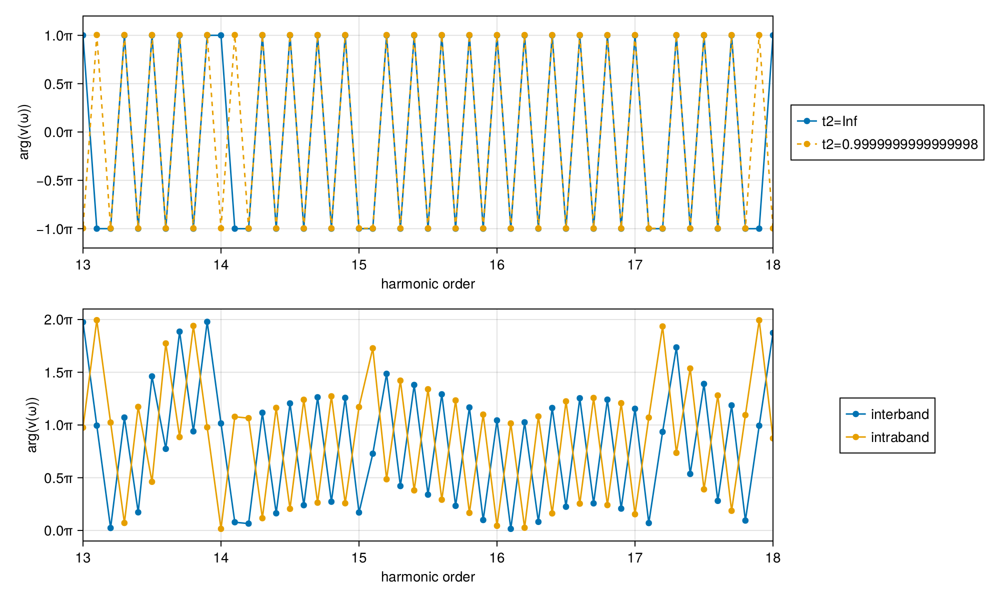

In [669]:
f   = Figure(size=(1000,600))
ax  = Axis(f[1,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)
ax2  = Axis(f[2,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)

scatterlines!(ax,fre,a.(ftver[1]) .- a.(ftvra[1]) ,label=ens[1].id)
scatterlines!(ax,fre,a.(ftver[end]) .- a.(ftvra[end]),label=ens[end].id,linestyle=:dash)
scatterlines!(ax2,fre,a.(ftver[1]),label="interband")
scatterlines!(ax2,fre,a.(ftvra[1]),label="intraband")

linkxaxes!(ax,ax2)
xlims!(ax2,13,18)
ylims!(ax,-1.2pi,1.2pi)
f[1,2] = Legend(f,ax)
f[2,2] = Legend(f,ax2)
f

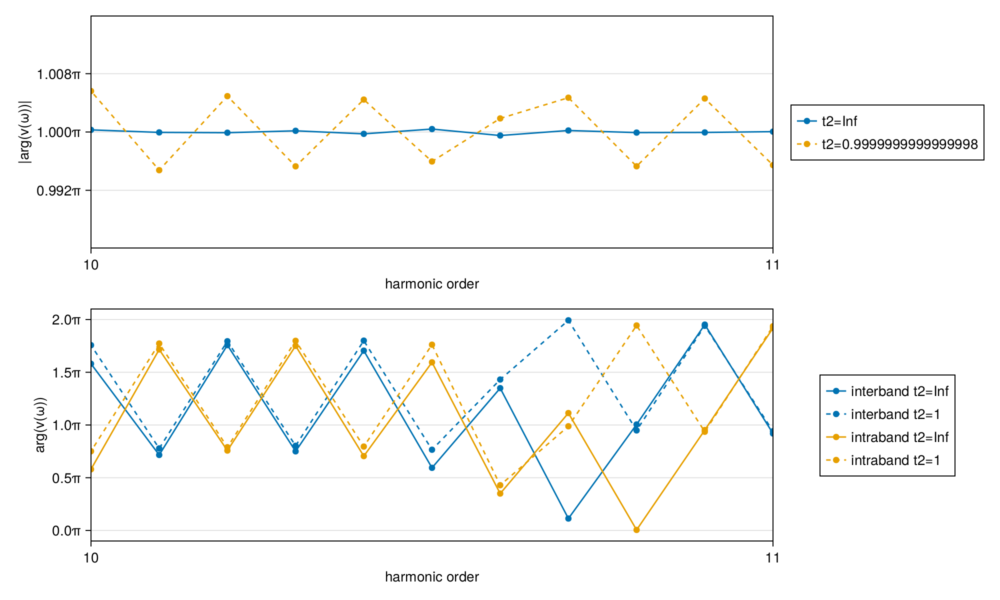

In [670]:
f   = Figure(size=(1000,600))
ax  = Axis(f[1,1],xlabel="harmonic order",ylabel="|arg(v(ω))|",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)
ax2  = Axis(f[2,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)

scatterlines!(ax,fre,abs.(a.(ftver[1]) .- a.(ftvra[1])) ,label=ens[1].id)
scatterlines!(ax,fre,abs.(a.(ftver[end]) .- a.(ftvra[end])),label=ens[end].id,linestyle=:dash)
scatterlines!(ax2,fre,a.(ftver[1]),label="interband t2=Inf")
scatterlines!(ax2,fre,a.(ftver[end]),label="interband t2=1",linestyle=:dash,color=Makie.wong_colors()[1])
scatterlines!(ax2,fre,a.(ftvra[1]),label="intraband t2=Inf")
scatterlines!(ax2,fre,a.(ftvra[end]),label="intraband t2=1",linestyle=:dash,color=Makie.wong_colors()[2])

linkxaxes!(ax,ax2)
xlims!(ax2,10,11)
ylims!(ax,pi-0.05,pi+0.05)
f[1,2] = Legend(f,ax)
f[2,2] = Legend(f,ax2)
f

## Now again with zero padding

### The spectra are unaffected

In [600]:
function pad(x::Vector,n::Integer)
    
    l = length(x)
    l > n && return x
    
    frontpadding = zeros(eltype(x),(n-l)÷2 + (n-1)%2)
    backpadding  = zeros(eltype(x),(n-l)÷2)
    return vcat(frontpadding,x,backpadding)        
end

pad (generic function with 1 method)

In [613]:
n         = 40_000
padftvtot = rfft.(pad.(applyhanning.(vtot),n));
padftver  = rfft.(pad.(applyhanning.(ver),n));
padftvra  = rfft.(pad.(applyhanning.(vra),n));
padfre    = abs.(fftfreq(n,fs)[1:n÷2+1]);

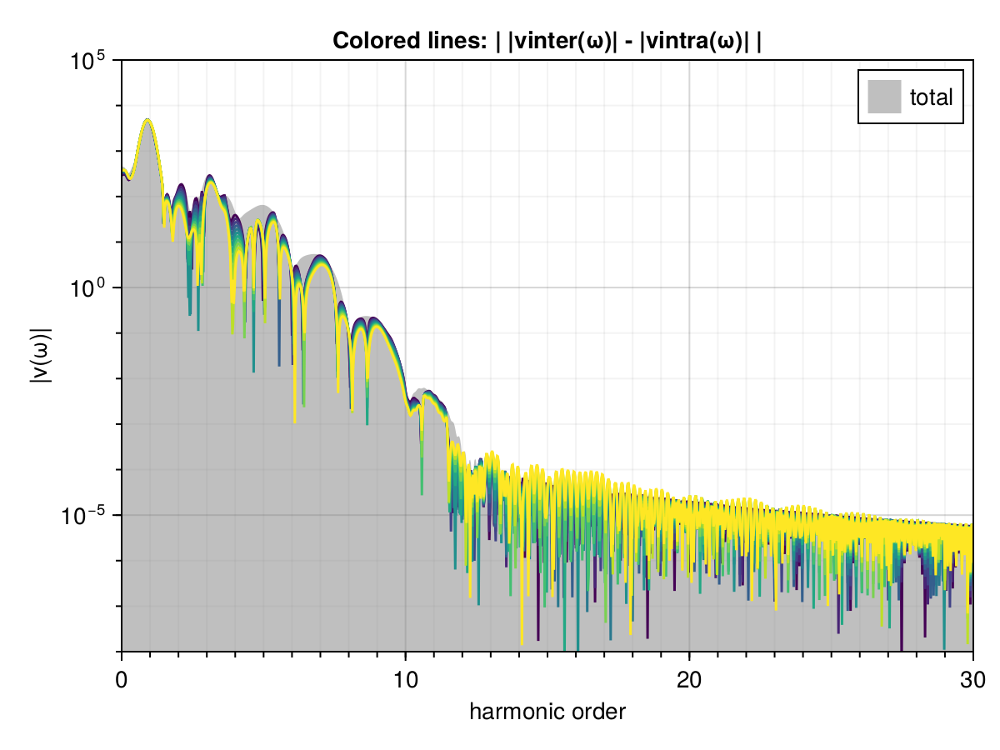

In [614]:
f   = Figure()
ax  = Axis(f[1,1],yscale=log10,xlabel="harmonic order",ylabel="|v(ω)|",title="Colored lines: | |vinter(ω)| - |vintra(ω)| |",
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorticks=0:30,
    yminorticksvisible=true,
    yminorgridvisible=true,
    yminorticks=[10.0^j for j in -20:10])

band!(ax,padfre,fill(1e-10,length(abs.(padftvtot[1]))),abs.(padftvtot[1]),color=(:grey,0.5),label="total")

for (i,v1,v2) in zip(1:length(padftvtot),padftver,padftvra)
    lines!(ax,padfre,abs.(abs.(v1) .- abs.(v2)) ;color=i,colorrange=(1,length(vtot)))
    #lines!(ax,fre,abs.(v1);color=i,colorrange=(1,length(vtot)),colormap=:magma)
end
xlims!(ax,0,30)
ylims!(ax,1e-8,10^5)
axislegend(ax)
f

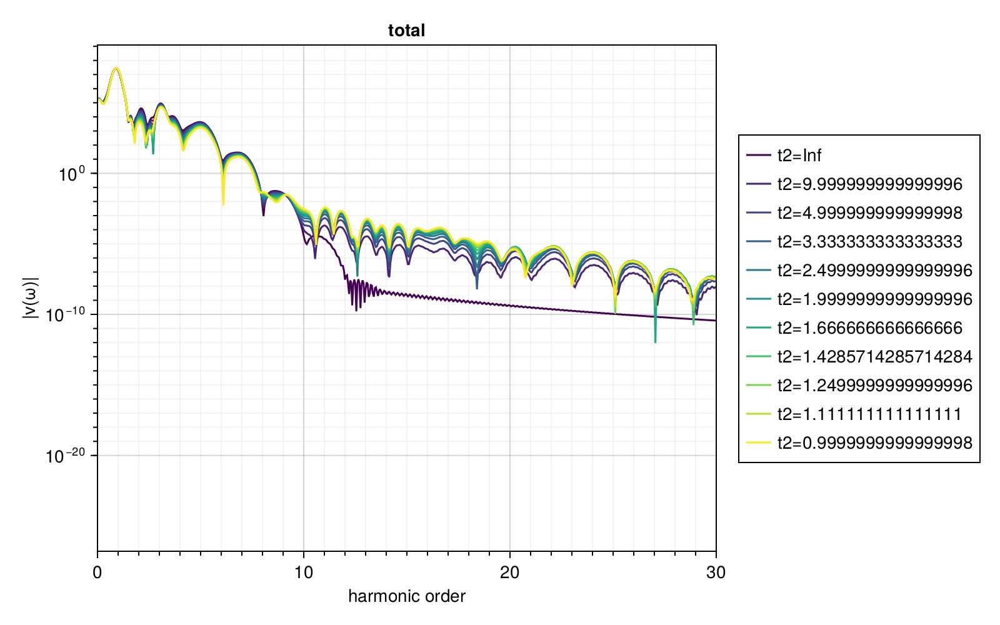

In [603]:
f   = Figure(size=(800,500))
ax  = Axis(f[1,1],yscale=log10,xlabel="harmonic order",ylabel="|v(ω)|",title="total",
    xminorticksvisible=true,
    xminorgridvisible=true,
    xminorticks=0:30,
    yminorticksvisible=true,
    yminorgridvisible=true,
    yminorticks=[10.0^j for j in -20:10])
for (i,d) in enumerate(padftvtot)
    inds = abs2.(d) .> 1e-30
    lines!(ax,padfre[inds],abs2.(d[inds]);color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end
xlims!(ax,0,30)
f[1,2] = Legend(f,ax)
f

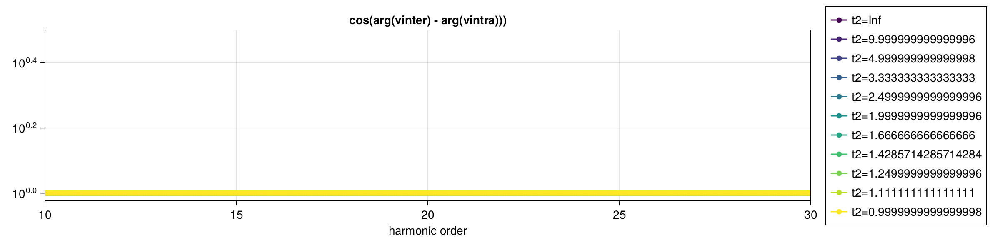

In [604]:
f   = Figure(size=(1200,300))
ax  = Axis(f[1,1],yscale=log10,xlabel="harmonic order",title="cos(arg(vinter) - arg(vintra)))")
for (i,v,v1,v2) in zip(1:length(vtot),padftvtot,padftver,padftvra)
    y = cos.(a.(v1) .- a.(v2)) .+ 2.0
    scatterlines!(ax,padfre,y;color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end
xlims!(ax,10,30)
f[1,2] = Legend(f,ax)
f

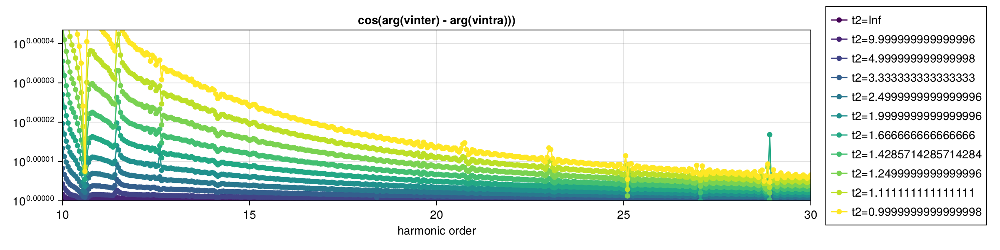

In [605]:
f   = Figure(size=(1200,300))
ax  = Axis(f[1,1],yscale=log10,xlabel="harmonic order",title="cos(arg(vinter) - arg(vintra)))")
for (i,v,v1,v2) in zip(1:length(vtot),padftvtot,padftver,padftvra)
    y = cos.(a.(v1) .- a.(v2)) .+ 2.0
    scatterlines!(ax,padfre,y;color=i,colorrange=(1,length(vtot)),label=ens[i].id)
end
xlims!(ax,10,30)
ylims!(ax,1,1+1e-4)
f[1,2] = Legend(f,ax)
f

### Phase difference

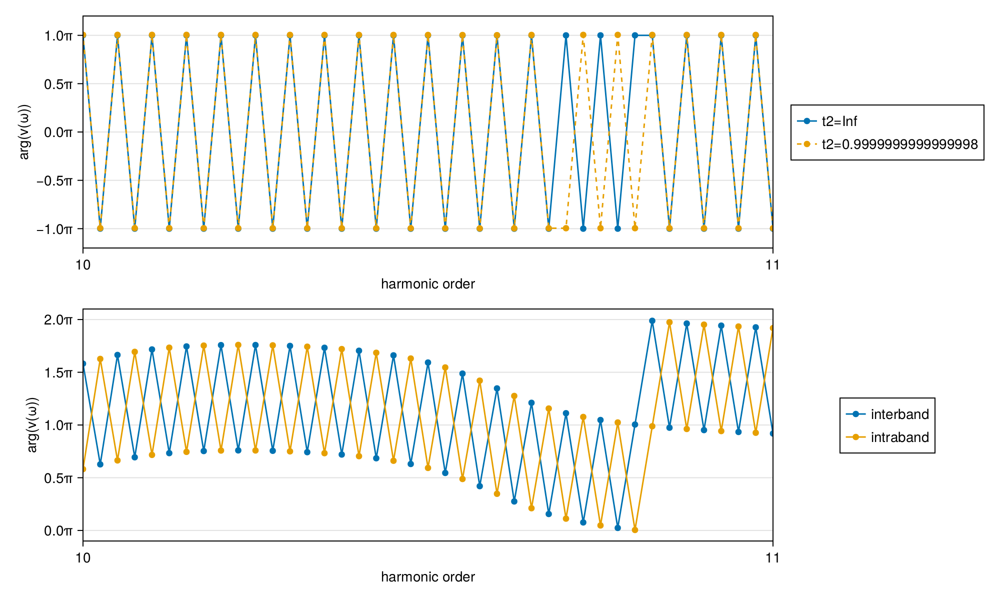

In [617]:
f   = Figure(size=(1000,600))
ax  = Axis(f[1,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)
ax2  = Axis(f[2,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)

scatterlines!(ax,padfre,a.(padftver[1]) .- a.(padftvra[1]) ,label=ens[1].id)
scatterlines!(ax,padfre,a.(padftver[end]) .- a.(padftvra[end]),label=ens[end].id,linestyle=:dash)
scatterlines!(ax2,padfre,a.(padftver[1]),label="interband")
scatterlines!(ax2,padfre,a.(padftvra[1]),label="intraband")

linkxaxes!(ax,ax2)
xlims!(ax2,10,11)
ylims!(ax,-1.2pi,1.2pi)
f[1,2] = Legend(f,ax)
f[2,2] = Legend(f,ax2)
f

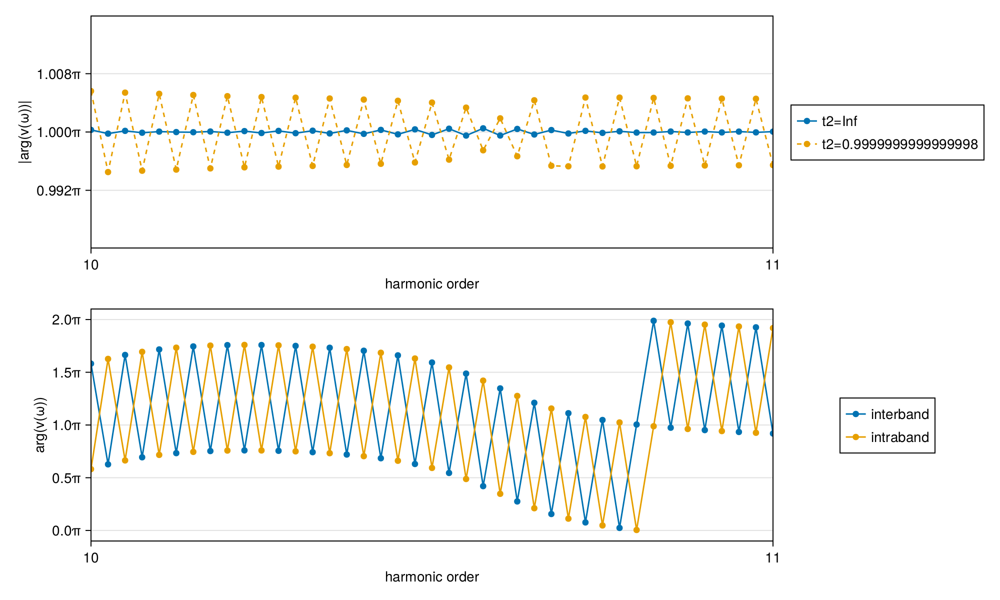

In [622]:
f   = Figure(size=(1000,600))
ax  = Axis(f[1,1],xlabel="harmonic order",ylabel="|arg(v(ω))|",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)
ax2  = Axis(f[2,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)

scatterlines!(ax,padfre,abs.(a.(padftver[1]) .- a.(padftvra[1])) ,label=ens[1].id)
scatterlines!(ax,padfre,abs.(a.(padftver[end]) .- a.(padftvra[end])),label=ens[end].id,linestyle=:dash)
scatterlines!(ax2,padfre,a.(padftver[1]),label="interband")
scatterlines!(ax2,padfre,a.(padftvra[1]),label="intraband")

linkxaxes!(ax,ax2)
xlims!(ax2,10,11)
ylims!(ax,pi-0.05,pi+0.05)
f[1,2] = Legend(f,ax)
f[2,2] = Legend(f,ax2)
f

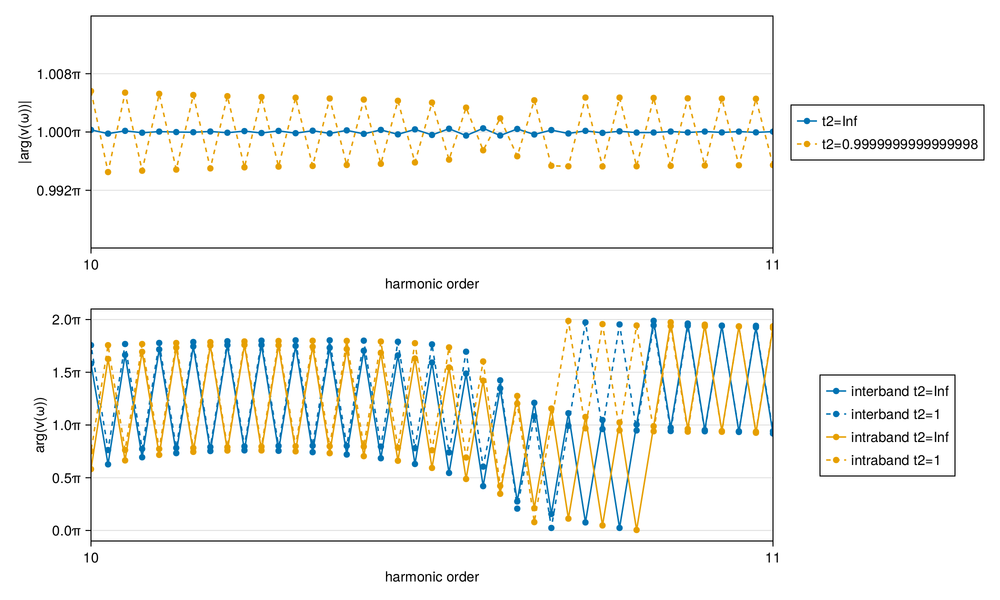

In [628]:
f   = Figure(size=(1000,600))
ax  = Axis(f[1,1],xlabel="harmonic order",ylabel="|arg(v(ω))|",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)
ax2  = Axis(f[2,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"),xticks=0:100)

scatterlines!(ax,padfre,abs.(a.(padftver[1]) .- a.(padftvra[1])) ,label=ens[1].id)
scatterlines!(ax,padfre,abs.(a.(padftver[end]) .- a.(padftvra[end])),label=ens[end].id,linestyle=:dash)
scatterlines!(ax2,padfre,a.(padftver[1]),label="interband t2=Inf")
scatterlines!(ax2,padfre,a.(padftver[end]),label="interband t2=1",linestyle=:dash,color=Makie.wong_colors()[1])
scatterlines!(ax2,padfre,a.(padftvra[1]),label="intraband t2=Inf")
scatterlines!(ax2,padfre,a.(padftvra[end]),label="intraband t2=1",linestyle=:dash,color=Makie.wong_colors()[2])

linkxaxes!(ax,ax2)
xlims!(ax2,10,11)
ylims!(ax,pi-0.05,pi+0.05)
f[1,2] = Legend(f,ax)
f[2,2] = Legend(f,ax2)
f

### Full t2 sweeps => can't see much

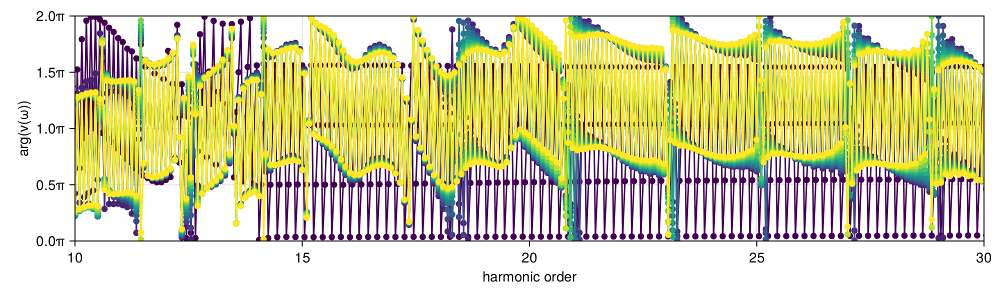

In [606]:
f   = Figure(size=(1000,300))
ax  = Axis(f[1,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"))

for (i,v,v1,v2) in zip(1:length(vtot),padftvtot,padftver,padftvra)
    scatterlines!(ax,padfre,a.(v);color=i,colorrange=(1,length(vtot)))
end
xlims!(ax,10,30)
ylims!(ax,0,2pi)
f

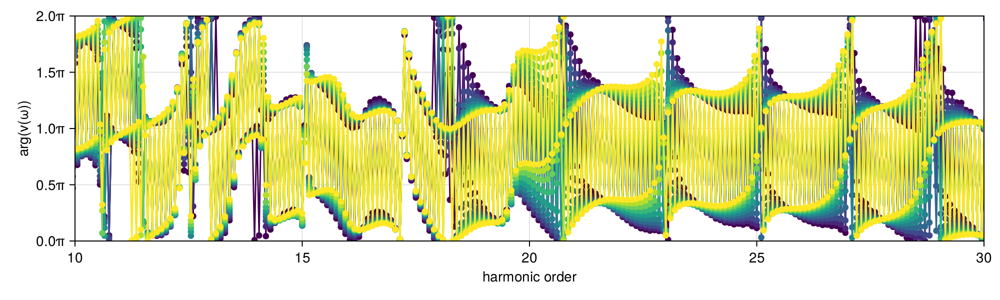

In [172]:
f   = Figure(size=(1000,300))
ax  = Axis(f[1,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"))

for (i,v,v1,v2) in zip(1:length(vtot),padftvtot,padftver,padftvra)
    scatterlines!(ax,padfre,a.(v1);color=i,colorrange=(1,length(vtot)))
end
xlims!(ax,10,30)
ylims!(ax,0,2pi)
f

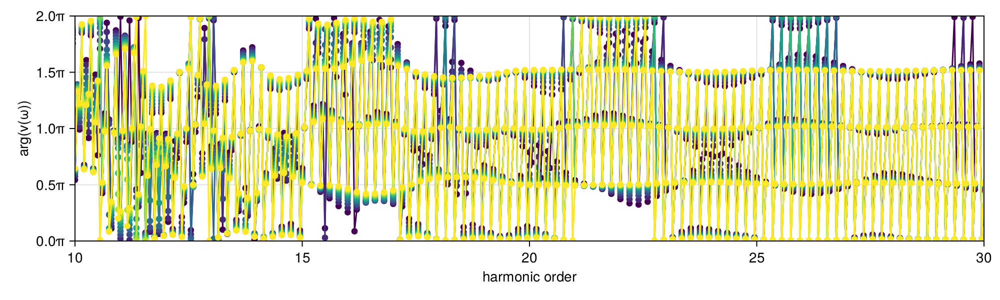

In [173]:
f   = Figure(size=(1000,300))
ax  = Axis(f[1,1],xlabel="harmonic order",ylabel="arg(v(ω))",yticks=MultiplesTicks(5,pi,"π"))

for (i,v,v1,v2) in zip(1:length(vtot),padftvtot,padftver,padftvra)
    scatterlines!(ax,padfre,a.(v2);color=i,colorrange=(1,length(vtot)))
end
xlims!(ax,10,30)
ylims!(ax,0,2pi)
f